## Santander-Customer-Transaction-Prediction

#### Background:
At Santander, mission is to help people and businesses prosper. We are always looking
for ways to help our customers understand their financial health and identify which
products and services might help them achieve their monetary goals.
Our data science team is continually challenging our machine learning algorithms,
working with the global data science community to make sure we can more accurately
identify new ways to solve our most common challenge, binary classification problems
such as: 
- is a customer satisfied?
- Will a customer buy this product? 
- Can a customer pay this loan? 

#### Problem Statement:
We need to identify which customers will make a specific transaction in the future, irrespective of the amount of money transacted.

- Supervised: The labels are included in the training data and the goal is to train a model to learn to predict the labels from the features
- Classification: The label is a binary variable, 0 (will not make a specific transaction in the future), 1 (will make a specific transaction in the future)

### Import Packages

In [32]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from matplotlib import style
from scipy import stats
import seaborn as sns
import missingno as msno
import pandas_profiling as pp
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


# configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
% matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)

# import the necessary modelling algos.

#classification.
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC,SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from catboost import CatBoostClassifier
import lightgbm as lgb

#regression
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeCV,ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from catboost import CatBoostRegressor
import xgboost as xg

#model selection
from sklearn.model_selection import train_test_split,cross_validate,cross_val_score,cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
import hyperopt as hpt
from catboost import cv,Pool

#evaluation metrics
from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error # for regression
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score  # for classification
from sklearn.metrics import classification_report,roc_auc_score,roc_curve, auc,confusion_matrix



### Exploratory Data Analysis (EDA)

- Data Collection
- Data Visualization
- Data Preprocessing

### Data Collection

In [33]:
os.chdir("C:\\Users\\kiran\\Desktop\\python practice\\Santander")

In [34]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')

In [4]:
#pfr=pp.ProfileReport(train)
#pfr

Number of variables,202
Number of observations,200000
Total Missing (%),0.0%
Total size in memory,308.2 MiB
Average record size in memory,1.6 KiB
Numeric,200
Categorical,0
Boolean,1
Date,0
Text (Unique),1
Rejected,0


In [5]:
# view profile report generated in the saved repository as a html file
#pfr.to_file("profile.html")

In [4]:
print(train.shape)
train.head(5)

(200000, 202)


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


####  train contains:

- ID_code (string)
- target
- 200 numerical variables, named from var_0 to var_199

####  test contains:

- ID_code (string)
- 200 numerical variables, named from var_0 to var_199

In [6]:
print(test.shape)
test.head(5)

(200000, 201)


,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


### Data Visualization


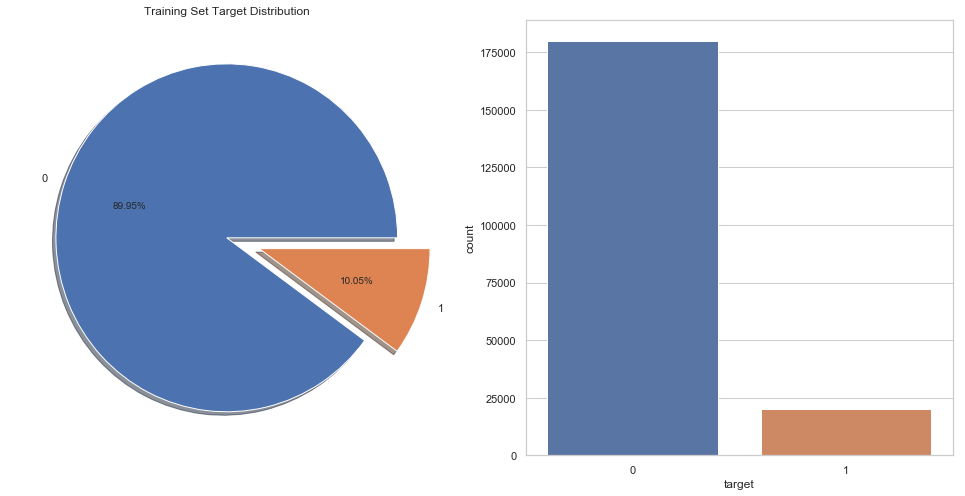

In [7]:
f,ax=plt.subplots(1,2,figsize=(15,8))

train['target'].value_counts().plot.pie(explode=[0,0.2],autopct='%1.2f%%',ax=ax[0],shadow=True)
ax[0].set_title('Training Set Target Distribution')
ax[0].set_ylabel('')
sns.countplot('target',data=train,ax=ax[1])
plt.show()
# The data is unbalanced with respect to target value

In [8]:
# KDE plots of features with respect to target value 0 and 1.

def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(10,5,figsize=(18,24))

    for feature in features:
        i += 1
        plt.subplot(10,5,i)
        sns.distplot(df1[feature], hist=False,label=label1,kde_kws = {'shade': True, 'linewidth': 2})
        sns.distplot(df2[feature], hist=False,label=label2,kde_kws = {'shade': True, 'linewidth': 2})
        plt.xlabel(feature, fontsize=11)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', labelsize=6, pad=-6)
        plt.tick_params(axis='y', labelsize=6)
    plt.show()

<Figure size 432x288 with 0 Axes>

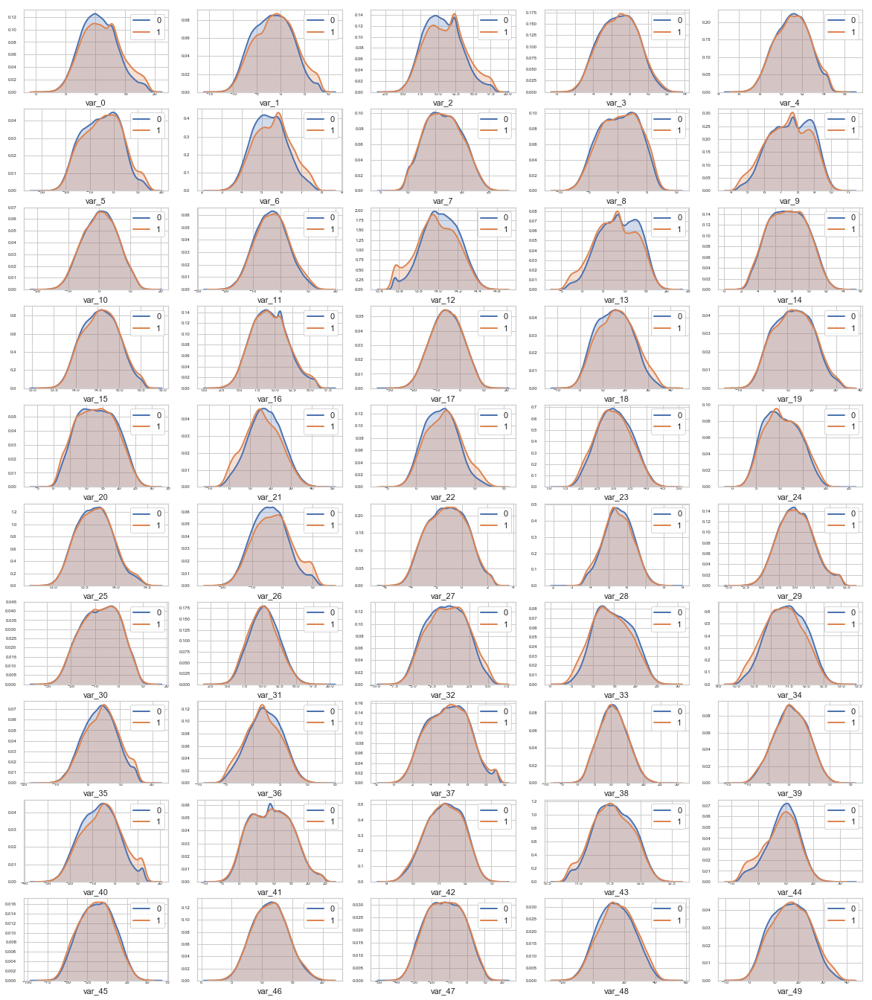

In [9]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
features = train.columns.values[2:52]
plot_feature_distribution(t0, t1, '0', '1', features)
#From var_0 to var_49

<Figure size 432x288 with 0 Axes>

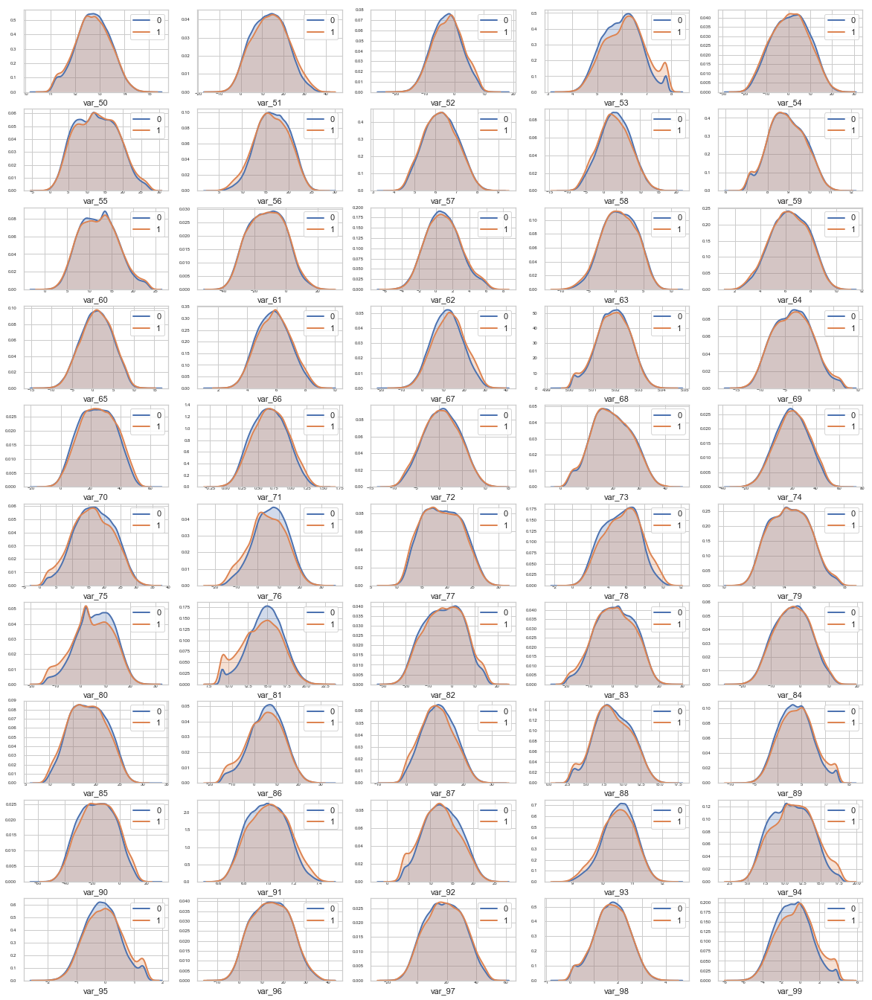

In [10]:
features = train.columns.values[52:102]
plot_feature_distribution(t0, t1, '0', '1', features)
#From var_50 to var_99

<Figure size 432x288 with 0 Axes>

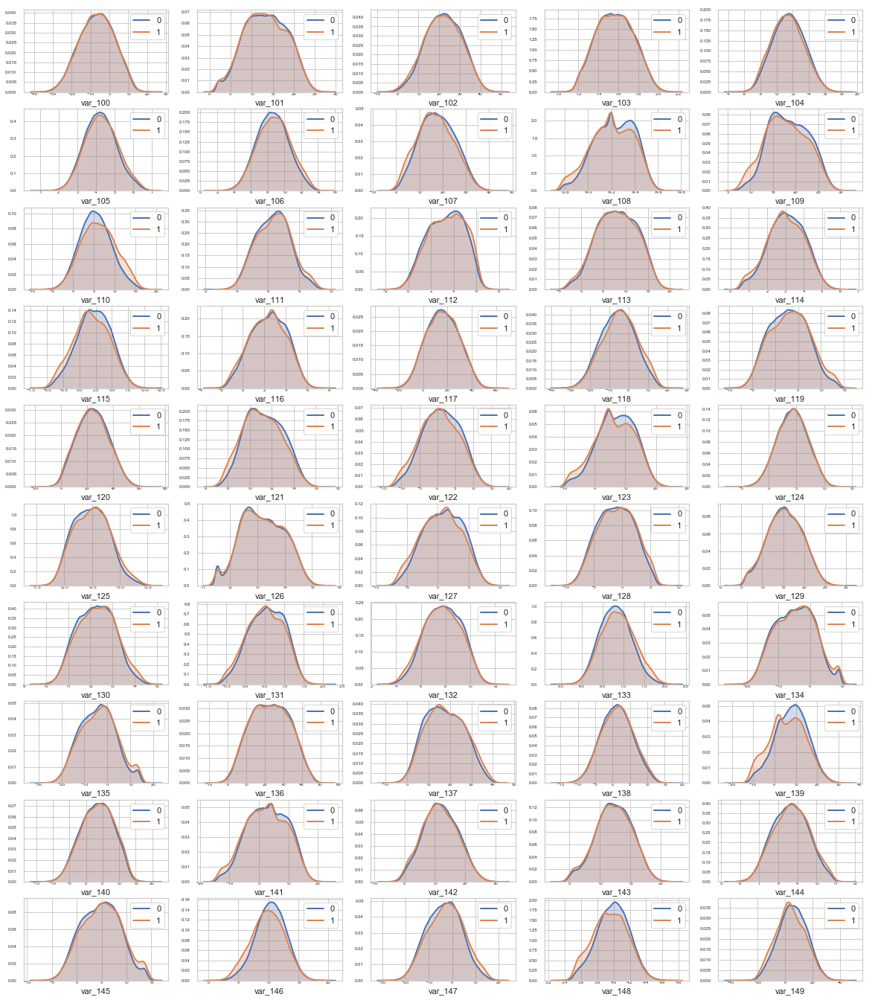

In [11]:
features = train.columns.values[102:152]
plot_feature_distribution(t0, t1, '0', '1', features)
#From var_100 to var_149

<Figure size 432x288 with 0 Axes>

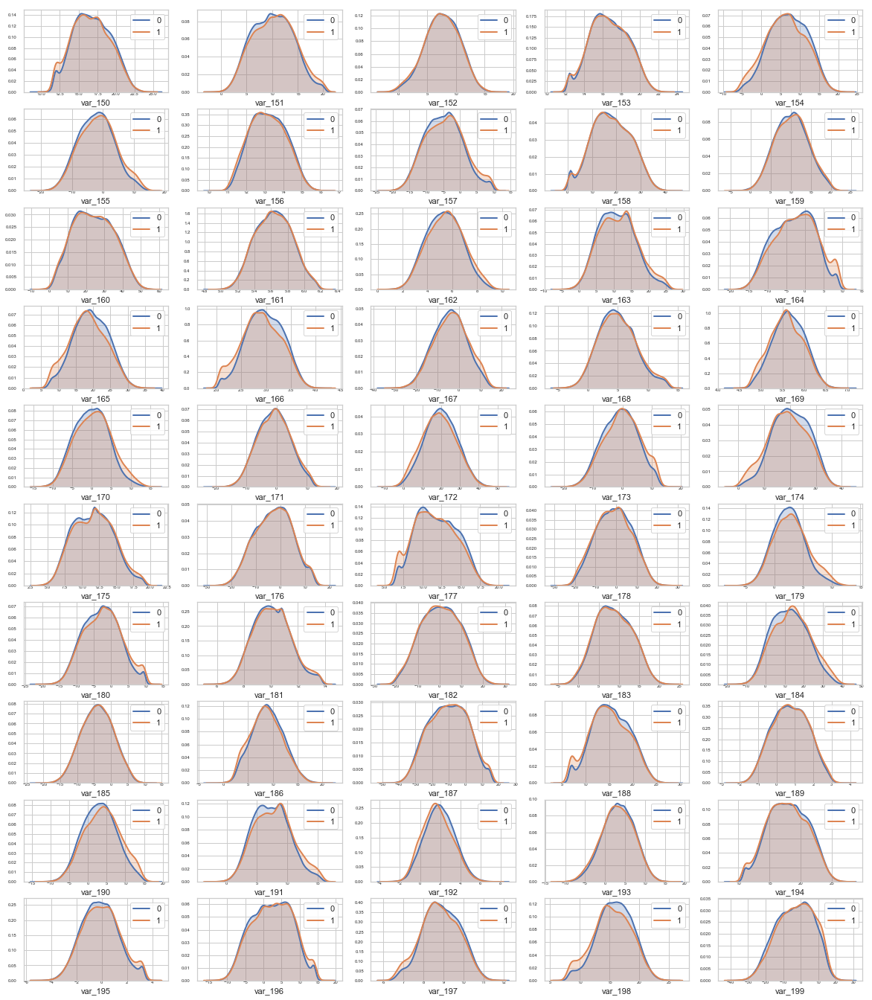

In [12]:
features = train.columns.values[152:202]
plot_feature_distribution(t0, t1, '0', '1', features)
#From var_150 to var_199

#### inference from the KDE plots above

- if we look closely var_2, var_9, var_12, var_13, var_26, var_40, var_53, var_81 and many others have resemblance of a dimodal type distribution.
- All of these variables have a bump of frequency that matches the rising of the probability of making a transaction.
- if pdf(target = 1) - pdf(target = 0) > 0, then there is a high probability of the client making a transfer.

###  Data Preprocessing

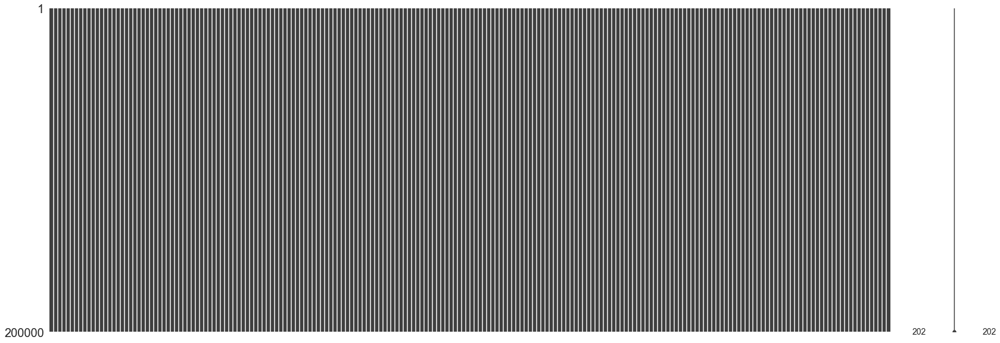

In [13]:
import missingno as msno
%matplotlib inline
msno.matrix(train)
#msno.bar(train,log=True)

In [14]:
# Missing Value Analysis
obs = train.isnull().sum().sort_values(ascending = False)
percent = round(train.isnull().sum().sort_values(ascending = False)/len(train)*100, 2)
pd.concat([obs, percent], axis = 1,keys= ['Number of Observations', 'Percent'])

# No missing values were found

,Number of Observations,Percent
var_199,0,0.0
var_61,0,0.0
var_71,0,0.0
var_70,0,0.0
var_69,0,0.0
var_68,0,0.0
var_67,0,0.0
var_66,0,0.0
var_65,0,0.0
var_64,0,0.0


In [15]:
for col in train.columns[2:]:
    print("Number of unique values of {} : {}".format(col, train[col].nunique()))
    
#Most features have more than thousands of values for each variable except var_68 (451)

Number of unique values of var_0 : 94672
Number of unique values of var_1 : 108932
Number of unique values of var_2 : 86555
Number of unique values of var_3 : 74597
Number of unique values of var_4 : 63515
Number of unique values of var_5 : 141029
Number of unique values of var_6 : 38599
Number of unique values of var_7 : 103063
Number of unique values of var_8 : 98617
Number of unique values of var_9 : 49417
Number of unique values of var_10 : 128764
Number of unique values of var_11 : 130193
Number of unique values of var_12 : 9561
Number of unique values of var_13 : 115181
Number of unique values of var_14 : 79122
Number of unique values of var_15 : 19810
Number of unique values of var_16 : 86918
Number of unique values of var_17 : 137823
Number of unique values of var_18 : 139515
Number of unique values of var_19 : 144180
Number of unique values of var_20 : 127764
Number of unique values of var_21 : 140062
Number of unique values of var_22 : 90660
Number of unique values of var_23 

In [16]:
train['var_68'].value_counts()

5.0214    1084
5.0215    1081
5.0209    1080
5.0183    1077
5.0179    1071
5.0208    1070
5.0193    1070
5.0202    1069
5.0174    1066
5.0203    1063
5.0189    1063
5.0195    1062
5.0220    1060
5.0204    1059
5.0211    1058
5.0188    1057
5.0157    1054
5.0158    1049
5.0219    1049
5.0190    1048
5.0201    1047
5.0221    1043
5.0207    1040
5.0192    1038
5.0212    1038
5.0184    1035
5.0205    1033
5.0151    1031
5.0185    1029
5.0197    1029
          ... 
4.9976       1
5.0415       1
5.0458       1
4.9951       1
5.0445       1
4.9995       1
5.0444       1
5.0000       1
5.0426       1
5.0421       1
4.9984       1
5.0419       1
5.0422       1
4.9964       1
5.0436       1
4.9979       1
4.9993       1
4.9977       1
5.0414       1
5.0418       1
5.0410       1
5.0412       1
4.9978       1
5.0469       1
4.9967       1
5.0407       1
5.0411       1
4.9938       1
4.9989       1
5.0431       1
Name: var_68, Length: 451, dtype: int64

#### Let's check duplicate values for each feature

- var_68, var_108,var_126 and var_12 were the top 4 features with max duplicate values

In [17]:
features = train.columns.values[2:202]
unique_max_train = []
for feature in features:
    values = train[feature].value_counts()
    unique_max_train.append([feature, values.max(), values.idxmax()])

In [18]:
np.transpose((pd.DataFrame(unique_max_train, columns=['Feature', 'Max duplicates', 'Value'])).
            sort_values(by = 'Max duplicates', ascending=False).head(15))

,68,108,126,12,91,103,148,71,161,25,125,169,166,133,43
Feature,var_68,var_108,var_126,var_12,var_91,var_103,var_148,var_71,var_161,var_25,var_125,var_169,var_166,var_133,var_43
Max duplicates,1084,313,305,203,66,61,59,54,52,41,40,39,39,39,39
Value,5.0214,14.1999,11.5356,13.5545,6.9785,1.6662,4.0456,0.7031,5.7688,13.6723,12.5159,5.6941,2.7306,6.8632,11.4522


### Correlation Analysis

- The  features are independent and not correlated to each other

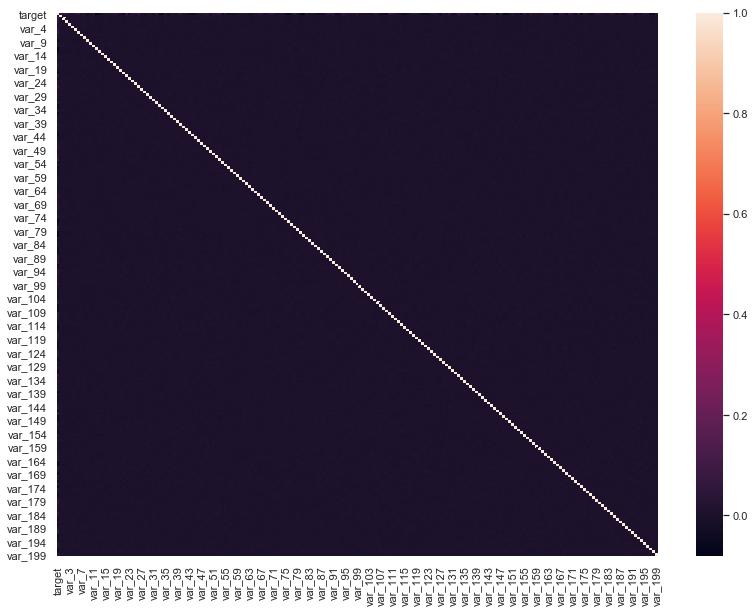

In [19]:
train_corr = train.corr()
plt.figure(figsize=(12,10))
sns.heatmap(train_corr)

In [20]:
corr = train.corr()
abs(corr['target']).sort_values(ascending=False).head(30)

target     1.000000
var_81     0.080917
var_139    0.074080
var_12     0.069489
var_6      0.066731
var_110    0.064275
var_146    0.063644
var_53     0.063399
var_26     0.062422
var_76     0.061917
var_174    0.061669
var_22     0.060558
var_21     0.058483
var_99     0.058367
var_166    0.057773
var_80     0.057609
var_190    0.055973
var_2      0.055870
var_165    0.055734
var_13     0.055156
var_148    0.055011
var_133    0.054548
var_198    0.053000
var_34     0.052692
var_0      0.052390
var_1      0.050343
var_115    0.050174
var_179    0.050002
var_109    0.049926
var_40     0.049530
Name: target, dtype: float64

In [46]:
correlations = train[features].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.tail(10)

,level_0,level_1,0
2440,var_190,var_171,0.007570
2441,var_171,var_190,0.007570
2442,var_166,var_191,0.007798
2443,var_191,var_166,0.007798
2444,var_167,var_173,0.008045
2445,var_173,var_167,0.008045
2446,var_172,var_193,0.008163
2447,var_193,var_172,0.008163
2448,var_183,var_189,0.009359
2449,var_189,var_183,0.009359


### Outlier Analysis

In [22]:
def plot_feature_boxplot(df, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(10,5,figsize=(18,24))

    for feature in features:
        i += 1
        plt.subplot(10,5,i)
        sns.boxplot(df[feature]) 
        plt.xlabel(feature, fontsize=11)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', labelsize=6, pad=-6)
        plt.tick_params(axis='y', labelsize=6)
    plt.show()

<Figure size 432x288 with 0 Axes>

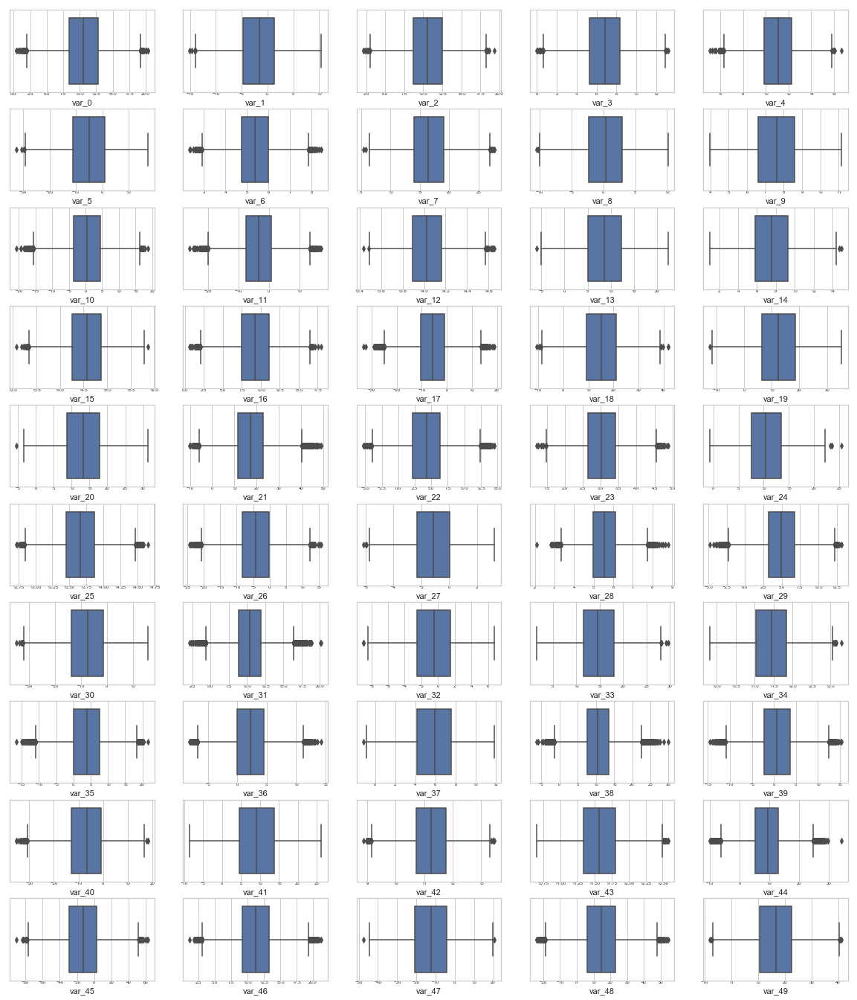

In [23]:
features = train.columns.values[2:52]
plot_feature_boxplot(train, features)
#From var_0 to var_49

<Figure size 432x288 with 0 Axes>

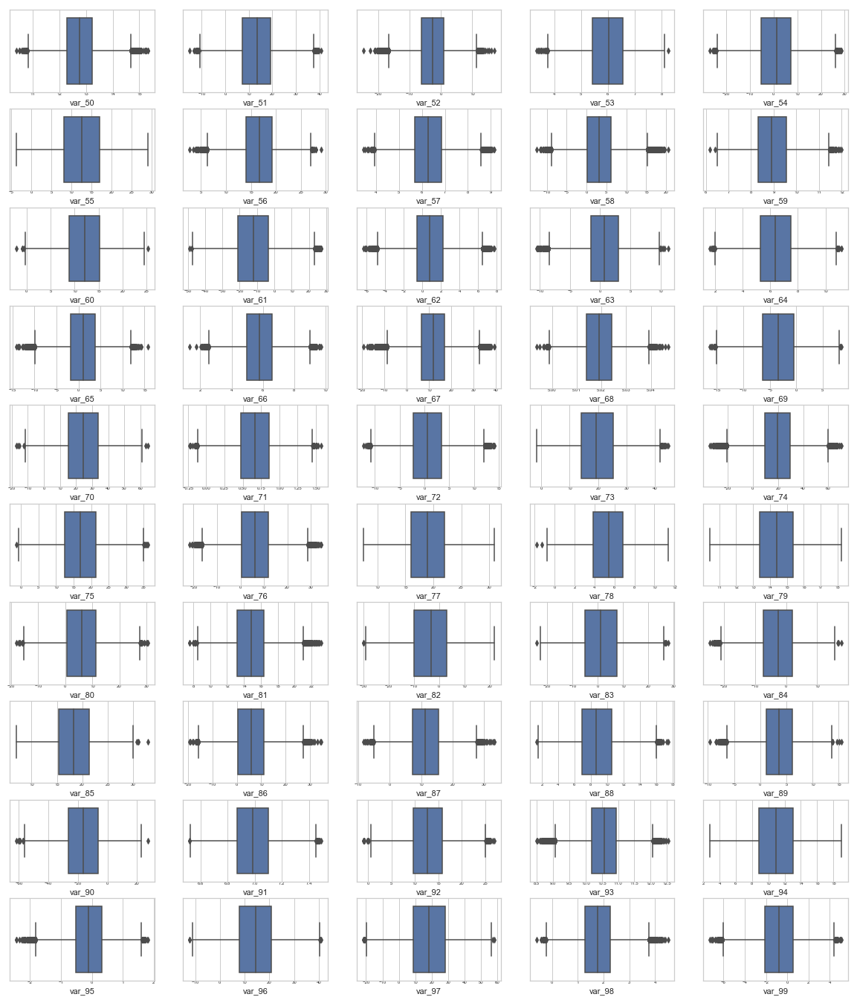

In [24]:
features = train.columns.values[52:102]
plot_feature_boxplot(train, features)
#From var_50 to var_99

<Figure size 432x288 with 0 Axes>

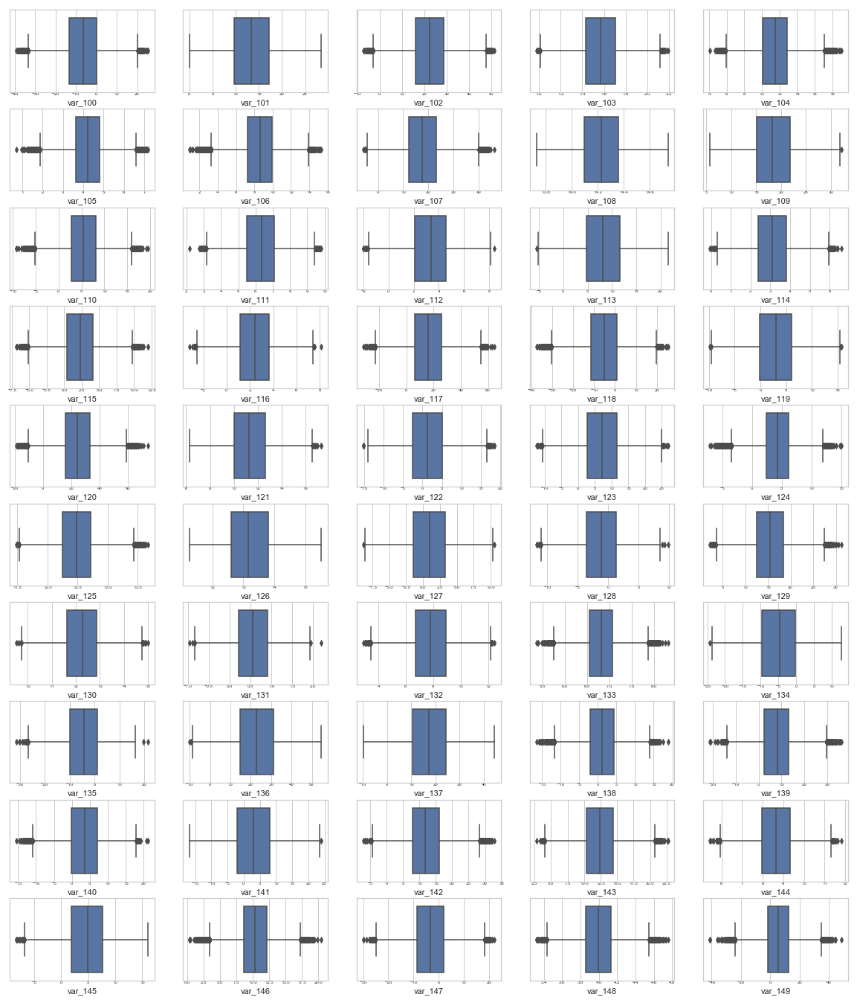

In [25]:
features = train.columns.values[102:152]
plot_feature_boxplot(train, features)
#From var_100 to var_149

<Figure size 432x288 with 0 Axes>

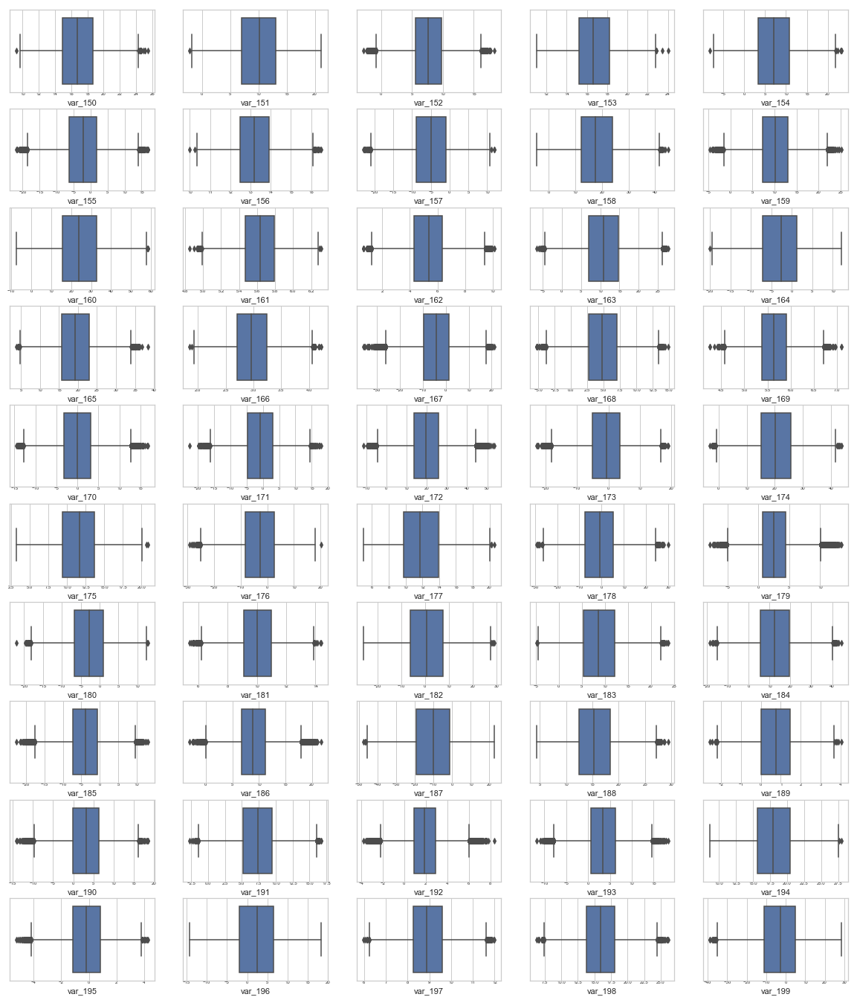

In [26]:
features = train.columns.values[152:202]
plot_feature_boxplot(train, features)
#From var_150 to var_199

In [27]:
# Detect outliers from IQR
Q1 = train.quantile(0.25)
Q3 = train.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

target      0.000000
var_0       4.304350
var_1       6.098650
var_2       3.794225
var_3       3.070025
var_4       2.377950
var_5      12.125150
var_6       1.235300
var_7       5.159100
var_8       5.255700
var_9       1.965625
var_10      7.977875
var_11      8.363425
var_12      0.270200
var_13      7.201975
var_14      3.488550
var_15      0.611700
var_16      3.603625
var_17      9.665450
var_18     11.835375
var_19     12.156825
var_20      9.251600
var_21     11.538050
var_22      4.110800
var_23      0.769700
var_24      5.866600
var_25      0.407300
var_26      8.231525
var_27      2.323525
var_28      1.101600
             ...    
var_170     6.354900
var_171     7.677150
var_172    12.175950
var_173     8.629425
var_174    10.576625
var_175     4.373900
var_176    11.090900
var_177     4.122625
var_178    12.734450
var_179     3.765550
var_180     7.670100
var_181     1.926600
var_182    13.563600
var_183     6.704325
var_184    13.792850
var_185     6.769350
var_186     4

In [28]:
print("df.shape:",train.shape)
df_in = train[~((train < (Q1 - 1.5 * IQR)) |(train > (Q3 + 1.5 * IQR))).any(axis=1)]
df_out = train[((train < (Q1 - 1.5 * IQR)) |(train > (Q3 + 1.5 * IQR))).any(axis=1)]
print("df_in.shape:",df_in.shape)
print("df_out.shape:",df_out.shape)

df.shape: (200000, 202)
df_in.shape: (157999, 202)
df_out.shape: (42001, 202)


In [29]:
df_in['target'].value_counts()

0    157999
Name: target, dtype: int64

In [30]:
# comparing the 'train' and 'df_out' dataset,
# we can say that all the data points with target equals to 1 are present as outliers 
df_out['target'].value_counts()

0    21903
1    20098
Name: target, dtype: int64

In [31]:
train['target'].value_counts()

0    179902
1     20098
Name: target, dtype: int64

In [32]:
# replace outliers greater than Q3 and less than Q1
#Q1=Q1.drop(labels=['target'])
#Q3=Q3.drop(labels=['target'])

#for a in range (0,200):
    #df_out['var_'+str(a)]=df_out['var_'+str(a)].apply(lambda x: Q3['var_'+str(a)] if x > Q3['var_'+str(a)] else Q1['var_'+str(a)])
    
#train_df = df_in.append(df_out, ignore_index=True)

### Principal component analysis (PCA)

- PCA is a dimensionality reduction technique that reduces less-informative 'noise' features. 
- But PCA is sensitive to variance and different scales, so standardizing will help PCA perform better.
- However, since we found that the correlation between different features in the training dataset is not that significant, so using PCA might not be meaningful.

In [33]:
from sklearn.preprocessing import StandardScaler
standardized_train = StandardScaler().fit_transform(train.set_index(['ID_code','target']))

In [34]:
standardized_train = pd.DataFrame(standardized_train, columns=train.set_index(['ID_code','target']).columns)
standardized_train = train[['ID_code','target']].join(standardized_train)

In [35]:
from sklearn.decomposition import PCA
k=80
pca = PCA(n_components=k, random_state=42, whiten=True)
pca.fit(standardized_train.set_index(['ID_code','target']))

PCA(copy=True, iterated_power='auto', n_components=80, random_state=42,
  svd_solver='auto', tol=0.0, whiten=True)

In [36]:
pca.explained_variance_ratio_

array([0.00591451, 0.00522552, 0.00521671, 0.00520654, 0.00519488,
       0.00518693, 0.00518222, 0.00517667, 0.00517406, 0.00517086,
       0.00516282, 0.00515946, 0.00514944, 0.00514182, 0.0051394 ,
       0.00513572, 0.00513078, 0.00512844, 0.00512544, 0.00511469,
       0.00511099, 0.00511025, 0.00510766, 0.00510344, 0.00509622,
       0.00509389, 0.00509118, 0.00508541, 0.00508276, 0.00507842,
       0.00507568, 0.00507154, 0.00506581, 0.0050639 , 0.00505997,
       0.00505587, 0.0050516 , 0.00504642, 0.00504114, 0.00503891,
       0.00503706, 0.00503184, 0.00503123, 0.00502715, 0.00502124,
       0.00501869, 0.00501523, 0.00501267, 0.00500916, 0.00500615,
       0.00500152, 0.00499823, 0.00499106, 0.00498848, 0.00498359,
       0.00498109, 0.00497583, 0.00497271, 0.00496443, 0.00496283,
       0.004962  , 0.00495606, 0.00495022, 0.00494825, 0.00494397,
       0.0049428 , 0.0049402 , 0.00493566, 0.00493158, 0.00492412,
       0.0049194 , 0.00491661, 0.00491372, 0.00490621, 0.00490

In [37]:
sum(pca.explained_variance_ratio_)

0.4040625557015899

Text(0,0.5,'Proportion of variance explained by additional feature')

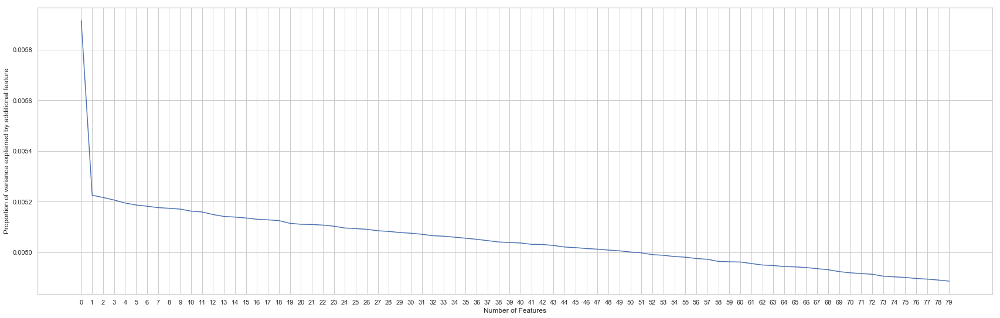

In [38]:
plt.figure(figsize=(26,9))
plt.plot(pca.explained_variance_ratio_)
plt.xticks(range(k))
plt.xlabel("Number of Features")
plt.ylabel("Proportion of variance explained by additional feature")

- Normally, if there is a elbow looking point in the graph above, the x value(number of features) of that point is usually the ideal number of components for PCA.
- However in this case, each principal component explains very little of the total variance (e.g. first principal component only explains about 0.6% of the total variance). 
- Even when we sum up all the variance explained by the 80 principal components, it only amounts to 40%. Let's increase the k and see what happens

In [39]:
sum(PCA(n_components=120, random_state=42, whiten=True).fit(standardized_train.set_index(['ID_code','target'])).\
explained_variance_ratio_)

0.6043175041677917

In [40]:
sum(PCA(n_components=170, random_state=42, whiten=True).fit(standardized_train.set_index(['ID_code','target'])).\
explained_variance_ratio_)

0.857173786247749

- Even with using 170 principal components, 85% of the total variance is explained.
- Hence we proved, that PCA is best when the dimension is very large and a lot of features are correlated to one another a lot.

## Feature Engineering

In [39]:
#Created new columns with the unique values count
for feat in ['var_' + str(x) for x in range(200)]:
    train_count_values = train.groupby(feat)[feat].count()
    test_count_values = test.groupby(feat)[feat].count()
    train['new_' + feat] = train_count_values.loc[train[feat]].values
    test['new_' + feat] = test_count_values.loc[test[feat]].values

In [40]:
train.head(3)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,new_var_190,new_var_191,new_var_192,new_var_193,new_var_194,new_var_195,new_var_196,new_var_197,new_var_198,new_var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,3,6,7,3,4,4,3,13,5,2
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,5,4,6,1,1,2,2,13,2,1
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,3,4,3,1,2,2,3,8,2,2


## Modelling

In [41]:
Target = train['target']

# Input dataset for Train and Test 
train_inp = train.drop(columns = ['target', 'ID_code'])
test_inp = test.drop(columns = ['ID_code'])

# List of feature names
features = list(train_inp.columns)

In [42]:
X_train, X_test, y_train, y_test = train_test_split(train_inp, Target, test_size= 0.3, random_state = 2019)

In [43]:
# check the split of train and validation
print('Train:',X_train.shape)
print('Test:',X_test.shape)

Train: (140000, 400)
Test: (60000, 400)


#### Logistic Regression
- We start with most basic algorithm used for classification problems. 
- Since this is an unbalanced dataset, we need to define parameter 'class_weight = balanced' which will give equal weights to both the targets irrespective of their representation in the training dataset. 


In [44]:
steps = [('scaler', StandardScaler()),
        ('logreg', LogisticRegression(class_weight='balanced'))]
        
# Create the pipeline: pipeline
pipeline = Pipeline(steps)

# Fit the pipeline to the training set
logreg_scaled = pipeline.fit(X_train,y_train)

y_pred = logreg_scaled.predict_proba(X_test)[:,1]

In [45]:
## first make a model function for modeling with confusion matrix
def model(model,features_train,features_test,labels_train,labels_test):
    clf= model
    clf.fit(features_train,labels_train)
    pred=clf.predict(features_test)
    cnf_matrix=confusion_matrix(labels_test,pred)
    print("the recall for this model is :",cnf_matrix[1,1]/(cnf_matrix[1,1]+cnf_matrix[1,0]))
    print("the precision for this model is :",cnf_matrix[1,1]/(cnf_matrix[1,1]+cnf_matrix[0,1]))
    fig= plt.figure(figsize=(10,7))
    print("TP",cnf_matrix[1,1]) # no of true transactions which are predicted as true 
    print("TN",cnf_matrix[0,0]) # no of false transaction which are predicted as false 
    print("FP",cnf_matrix[0,1]) # no of false transactions which are predicted as true
    print("FN",cnf_matrix[1,0]) # no of true transactions which are predicted as false 
    sns.heatmap(cnf_matrix,cmap="Blues",annot=True,fmt="d",linewidths=1,linecolor='black')
    plt.title("Confusion_matrix")
    plt.xlabel("Predicted_class")
    plt.ylabel("Real class")
    plt.show()
    print("\n----------Classification Report------------------------------------")
    print(classification_report(labels_test,pred))

the recall for this model is : 0.7710365349644569
the precision for this model is : 0.2943329546888805
TP 4664
TN 42769
FP 11182
FN 1385


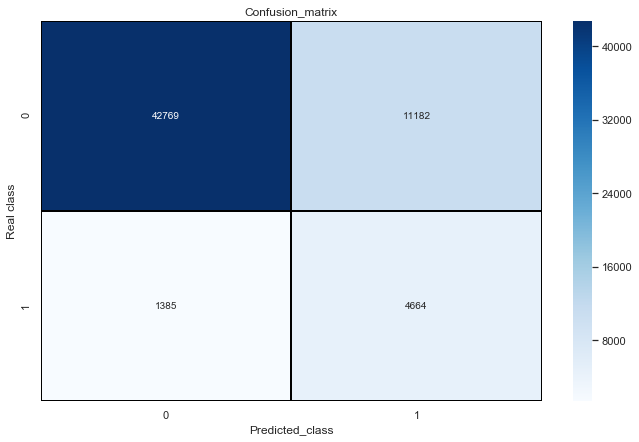


----------Classification Report------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.79      0.87     53951
           1       0.29      0.77      0.43      6049

   micro avg       0.79      0.79      0.79     60000
   macro avg       0.63      0.78      0.65     60000
weighted avg       0.90      0.79      0.83     60000



In [46]:
model(logreg_scaled,X_train, X_test, y_train, y_test)

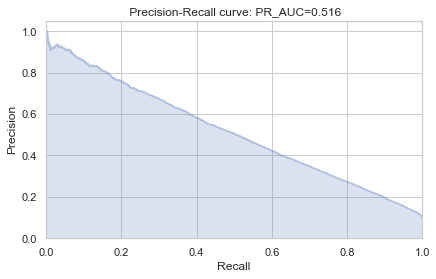

In [57]:
from inspect import signature
from sklearn.metrics import average_precision_score,precision_recall_curve
def plot_precision_recall(y_test, y_pred): 
    precision, recall, _ = precision_recall_curve(y_test, y_pred)

    # In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
    step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})
    plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title(' Precision-Recall curve: PR_AUC={0:0.3f}'.format( auc(recall, precision)))
plot_precision_recall(y_test, y_pred)

In [64]:
def plot_roc_curve(fpr, tpr):  
    fig= plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve: ROC_AUC={0:0.5f}'.format(roc_auc_score(y_test, y_pred)))
    plt.legend()
    plt.show()

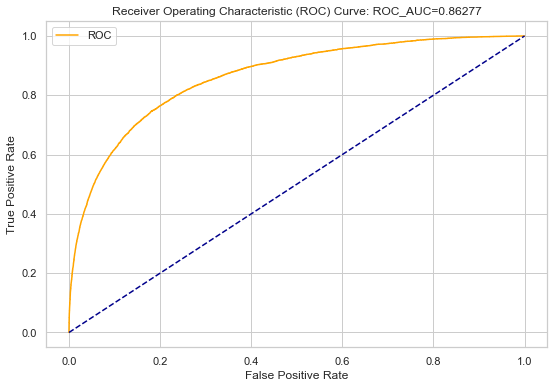

In [65]:
y_pred = logreg_scaled.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred) 
plot_roc_curve(fpr, tpr) 

### Decision Trees
- Moving on to a slightly advanced algorithm, decision trees. Again, the parameters here are class_weight to deal with unbalanced target variable, random_state for reproducability of same trees. The feature max_features and min_sample_leaf are used to prune the tree and avoid overfitting to the training data.

- Max_features defines what proportion of available input features will be used to create tree.

- Min_sample_leaf restricts the minimum number of samples in a leaf node, making sure none of the leaf nodes has less than 80 samples in it. If leaf nodes have less samples it implies we have grown the tree too much and trying to predict each sample very precisely, thus leading to overfitting.

In [155]:
tree_clf = DecisionTreeClassifier(class_weight='balanced', random_state = 2019, 
                                  max_features = 0.7, min_samples_leaf = 80)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=0.7, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=80, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=2019,
            splitter='best')

the recall for this model is : 0.5617457430980327
the precision for this model is : 0.15279464004676468
TP 3398
TN 35110
FP 18841
FN 2651


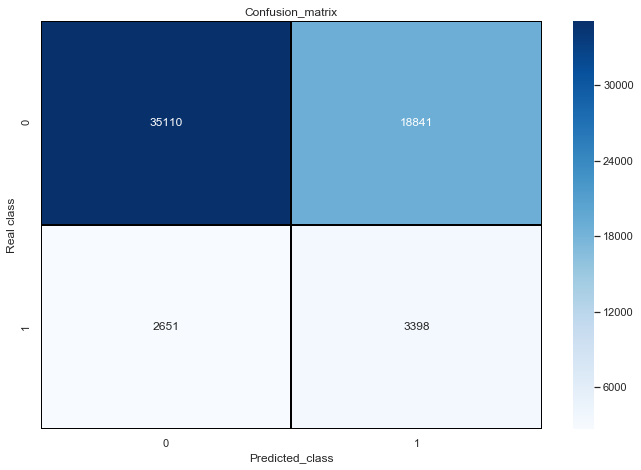


----------Classification Report------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.65      0.77     53951
           1       0.15      0.56      0.24      6049

   micro avg       0.64      0.64      0.64     60000
   macro avg       0.54      0.61      0.50     60000
weighted avg       0.85      0.64      0.71     60000



In [156]:
model(tree_clf,X_train, X_test, y_train, y_test)

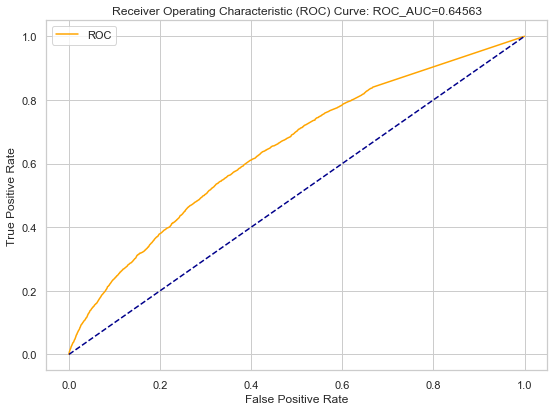

In [157]:
y_pred = tree_clf.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr)

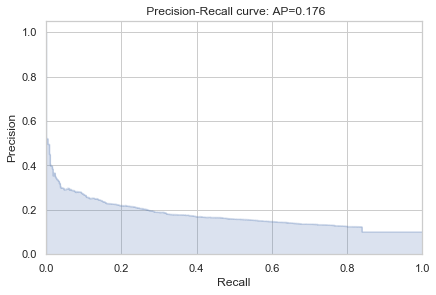

In [158]:
plot_precision_recall(y_test, y_pred)

In [129]:
# Extract feature importances
feature_importance_values = tree_clf.feature_importances_
feature_importances = pd.DataFrame({'feature': features, 'importance': feature_importance_values})
feature_importances.sort_values(by='importance', ascending=False).head(n=10)

,feature,importance
81,var_81,0.060000
139,var_139,0.046336
12,var_12,0.038998
146,var_146,0.026827
26,var_26,0.026695
53,var_53,0.024909
110,var_110,0.024318
166,var_166,0.020299
174,var_174,0.018643
109,var_109,0.017605


### Ensemble Learning
- Ensemble Learning refers to the algorithms that created using ensembles of variour learning algorithms. For example, random forests are ensembles of many decision tree estimators.


- There are 2 types of ensemble learning algorithms 
    1. Bagging Algorithms: Bagging involves having each model in the ensemble vote with equal weight for the final output. In order to promote model variance, bagging trains each model in the ensemble using a randomly drawn subset of the training set 
    2. Boosting Algorithms: Boosting involves incrementally building an ensemble by training each new model instance to emphasize the training instances that previous models mis-classified.

#### Random Forest
- Let's start with building a random forest, with parameters like class_weight, random_state, and hyperparameters like max_features and min_sample_leaf as earlier. We have also defined the n_estimators which is a compulsory parameter. This defines the number of decision trees that will be present in the forest.

In [160]:
# Create random Forest Object using the mentioned parameters
random_forest = RandomForestClassifier(n_estimators=100, random_state=2019, verbose=1,
                                      class_weight='balanced', max_features = 0.5, 
                                       min_samples_leaf = 100)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 44.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.5s finished


the recall for this model is : 0.49380062820300874
the precision for this model is : 0.2878481256625229
TP 2987
TN 46561
FP 7390
FN 3062


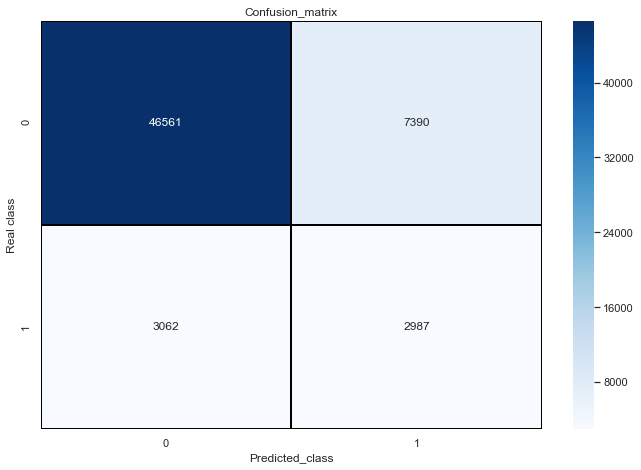


----------Classification Report------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.86      0.90     53951
           1       0.29      0.49      0.36      6049

   micro avg       0.83      0.83      0.83     60000
   macro avg       0.61      0.68      0.63     60000
weighted avg       0.87      0.83      0.85     60000



In [161]:
model(random_forest,X_train, X_test, y_train, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished


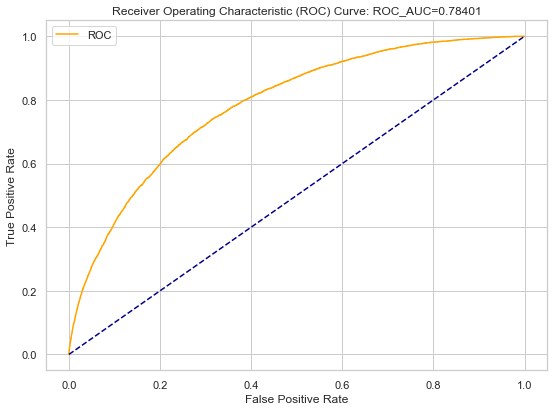

In [162]:
y_pred = random_forest.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr)

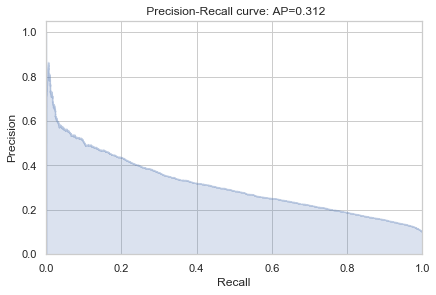

In [163]:
plot_precision_recall(y_test, y_pred)

In [164]:
# Extract feature importances
feature_importance_values = random_forest.feature_importances_
feature_importances = pd.DataFrame({'feature': features, 'importance': feature_importance_values})
feature_importances.sort_values(by='importance', ascending=False).head(n=10)

,feature,importance
81,var_81,0.064347
139,var_139,0.050428
12,var_12,0.037299
26,var_26,0.028552
53,var_53,0.027163
110,var_110,0.026724
146,var_146,0.025624
6,var_6,0.021428
174,var_174,0.018871
109,var_109,0.016396


#### Light Gradient Boosting Method

WHAT IS IT?

- Light GBM is a gradient boosting framework that uses tree based learning algorithm. It grows tree vertically while other algorithm grows trees horizontally meaning that Light GBM grows tree leaf-wise while other algorithm grows level-wise. Leaf-wise algorithm can reduce more loss than a level-wise algorithm.

WHY USE LGB?

- It is ‘Light’ because of its high speed. It can handle large data, requires low memory to run and focuses on accuracy of results. 

Ensemble of 200 LGB models
- training model with 2 features at a time: The original one and an extra column with the unique values count.

In [66]:
param = {
   'learning_rate': 0.05,
   'max_depth': 4,
   'num_leaves': 25,
   'feature_fraction': 1,
   'objective': 'binary',
   'boosting_type': 'gbdt',
   'verbosity': -1,
   'metric': 'auc',
   'is_unbalance': True
    }

In [91]:
seed = 2319
iterations = 130


features = [c for c in X_train.columns if (c not in ['ID_code', 'target'])]
feature_importance_df = pd.DataFrame()
test_size = 0.3

y_hat = np.zeros([int(200000*test_size), 200])

i = 0
for feature in ['var_' + str(x) for x in range(200)]: # loop over all features
    print(feature)
    feat_choices = [feature, 'new_' + feature]
    lgb_train = lgb.Dataset(X_train[feat_choices], y_train)
    gbm = lgb.train(param, lgb_train, iterations, verbose_eval=-1)
    y_hat[:, i] = gbm.predict(X_test[feat_choices], num_iteration=gbm.best_iteration)
    feature_importance_df= feature_importance_df.append({'feature' : feature, 
    'importance': gbm.feature_importance()} ,ignore_index=True)
    i += 1
    
y_pred = (y_hat).sum(axis=1)
score = roc_auc_score(y_test, y_pred)
print('Your roc_auc score is', score)  #0.8855

var_0
var_1
var_2
var_3
var_4
var_5
var_6
var_7
var_8
var_9
var_10
var_11
var_12
var_13
var_14
var_15
var_16
var_17
var_18
var_19
var_20
var_21
var_22
var_23
var_24
var_25
var_26
var_27
var_28
var_29
var_30
var_31
var_32
var_33
var_34
var_35
var_36
var_37
var_38
var_39
var_40
var_41
var_42
var_43
var_44
var_45
var_46
var_47
var_48
var_49
var_50
var_51
var_52
var_53
var_54
var_55
var_56
var_57
var_58
var_59
var_60
var_61
var_62
var_63
var_64
var_65
var_66
var_67
var_68
var_69
var_70
var_71
var_72
var_73
var_74
var_75
var_76
var_77
var_78
var_79
var_80
var_81
var_82
var_83
var_84
var_85
var_86
var_87
var_88
var_89
var_90
var_91
var_92
var_93
var_94
var_95
var_96
var_97
var_98
var_99
var_100
var_101
var_102
var_103
var_104
var_105
var_106
var_107
var_108
var_109
var_110
var_111
var_112
var_113
var_114
var_115
var_116
var_117
var_118
var_119
var_120
var_121
var_122
var_123
var_124
var_125
var_126
var_127
var_128
var_129
var_130
var_131
var_132
var_133
var_134
var_135
var_136
var_137
var_13

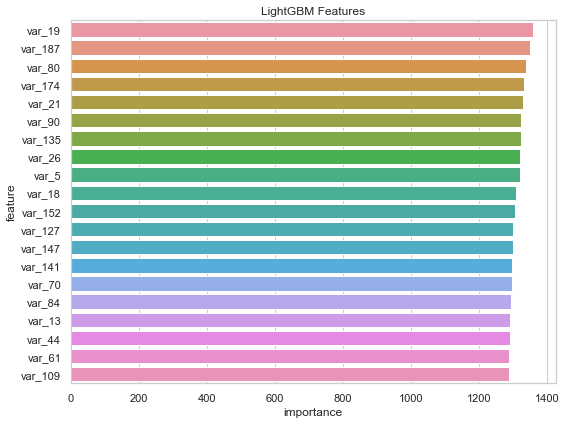

In [97]:
#feature_importance_df['importance']=feature_importance_df['importance'].apply(lambda x : x[0])
cols = (feature_importance_df[["feature", "importance"]]
        .groupby("feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:20].index)
best_features = feature_importance_df.loc[feature_importance_df.feature.isin(cols)]

plt.figure(figsize=(8,6))
sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance",ascending=False))
plt.title('LightGBM Features')
plt.tight_layout()

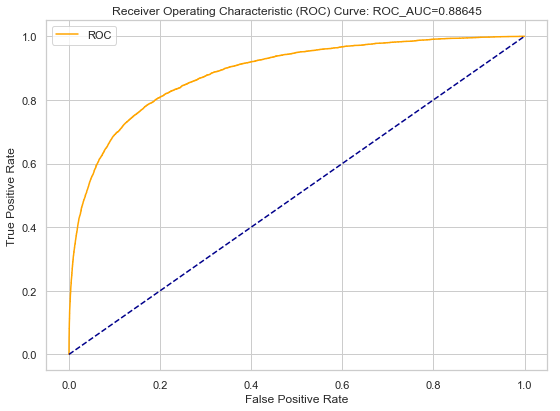

In [287]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr)

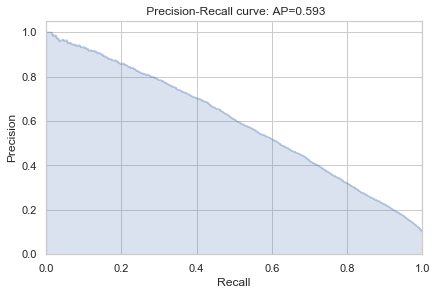

In [288]:
plot_precision_recall(y_test, y_pred)

#### hyperparameter tuning using BayesianOptimization

In [277]:
from bayes_opt import BayesianOptimization

In [337]:
X = X_train
y = y_train


def bayes_parameter_opt_lgb(X, y, init_round=15, opt_round=25, n_folds=3, random_seed=6,n_estimators=10000, output_process=False):
    # prepare data
    train_data = lgb.Dataset(data=X, label=y, free_raw_data=False)
    # parameters
    def lgb_eval(learning_rate,num_leaves, bagging_fraction,lambda_l1,
                lambda_l2, min_gain_to_split,max_depth, bagging_freq, min_data_in_leaf,min_sum_hessian_in_leaf):
        params = {'application':'binary', 'metric':'auc','is_unbalance':True}
        params['learning_rate'] = max(min(learning_rate, 1), 0)
        params["num_leaves"] = int(round(num_leaves))
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['feature_fraction'] = 1
        params['lambda_l1'] = max(min(lambda_l1, 1), 0)
        params['lambda_l2'] = max(min(lambda_l2, 2), 1)
        params['min_gain_to_split'] = max(min(min_gain_to_split, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['bagging_freq'] = int(round(bagging_freq))
        params['min_data_in_leaf'] = int(round(min_data_in_leaf))
        params['min_sum_hessian_in_leaf'] = min_sum_hessian_in_leaf
        
        cv_result = lgb.cv(params, train_data, nfold=n_folds, seed=random_seed, stratified=True, 
                    verbose_eval =200, metrics=['auc'])
        return max(cv_result['auc-mean'])
     
    lgbBO = BayesianOptimization(lgb_eval, {'learning_rate': (0.001, 0.01),
                                            'num_leaves': (20, 30),
                                            'bagging_fraction': (0.7, 1),
                                            'bagging_freq' : (2,5),
                                            'lambda_l1' : (0.7,1),
                                            'lambda_l2' : (1,2),
                                            'max_depth': (3,5),
                                            'min_data_in_leaf': (20, 25),
                                            'min_gain_to_split': (0.05,1),
                                            'min_sum_hessian_in_leaf':(15,20)
                                            }, random_state=200)
      
    
    lgbBO.maximize(init_points=init_round, n_iter=opt_round,acq='ucb', xi=0.0, alpha=1e-6)
    
    model_auc=[]
    for model in range(len( lgbBO.res)):
        model_auc.append(lgbBO.res[model]['target'])
    
    # return best parameters
    return lgbBO.res[pd.Series(model_auc).idxmax()]['target'],lgbBO.res[pd.Series(model_auc).idxmax()]['params']

opt_params = bayes_parameter_opt_lgb(X, y, init_round=10, opt_round=10, n_folds=3, random_seed=6,n_estimators=10000)

|   iter    |  target   | baggin... | baggin... | lambda_l1 | lambda_l2 | learni... | max_depth | min_da... | min_ga... | min_su... | num_le... |
-------------------------------------------------------------------------------------------------------------------------------------------------
|  1        |  0.731    |  0.9843   |  2.68     |  0.8783   |  1.428    |  0.007877 |  3.006    |  21.79    |  0.9142   |  17.28    |  29.82    |
|  2        |  0.7339   |  0.9602   |  4.958    |  0.977    |  1.304    |  0.008615 |  3.242    |  23.93    |  0.288    |  15.48    |  29.43    |
|  3        |  0.7345   |  0.9478   |  3.555    |  0.9621   |  1.578    |  0.005051 |  4.36     |  22.1     |  0.6584   |  18.04    |  21.05    |
|  4        |  0.697    |  0.9898   |  4.276    |  0.9039   |  1.329    |  0.001238 |  4.607    |  24.86    |  0.3188   |  18.25    |  22.66    |
|  5        |  0.7375   |  0.7563   |  3.257    |  0.8998   |  1.517    |  0.00869  |  3.342    |  24.89    |  0.3362   |  1

In [338]:
opt_params[1]["num_leaves"] = int(round(opt_params[1]["num_leaves"]))
opt_params[1]['max_depth'] = int(round(opt_params[1]['max_depth']))
opt_params[1]['min_data_in_leaf'] = int(round(opt_params[1]['min_data_in_leaf']))
opt_params[1]['bagging_freq'] = int(round(opt_params[1]['bagging_freq']))
opt_params[1]['objective']='binary'
opt_params[1]['metric']='auc'
opt_params[1]['is_unbalance']=True
opt_params[1]['boost_from_average']=False
opt_params=opt_params[1]
opt_params

{'bagging_fraction': 0.7,
 'bagging_freq': 2,
 'boost_from_average': False,
 'is_unbalance': True,
 'lambda_l1': 0.7,
 'lambda_l2': 1.9999999964082154,
 'learning_rate': 0.009999999503478726,
 'max_depth': 5,
 'metric': 'auc',
 'min_data_in_leaf': 25,
 'min_gain_to_split': 0.9880270270985563,
 'min_sum_hessian_in_leaf': 20.0,
 'num_leaves': 30,
 'objective': 'binary'}

In [339]:
seed = 2319
iterations = 130

features = [c for c in X_train.columns if (c not in ['ID_code', 'target'])]
feature_importance_df = pd.DataFrame()
test_size = 0.3

y_hat = np.zeros([int(200000*test_size), 200])

i = 0
for feature in ['var_' + str(x) for x in range(200)]: # loop over all features
    #print(feature)
    feat_choices = [feature, 'new_' + feature]
    lgb_train = lgb.Dataset(X_train[feat_choices], y_train)
    gbm = lgb.train(opt_params, lgb_train, iterations, verbose_eval=-1)
    y_hat[:, i] = gbm.predict(X_test[feat_choices], num_iteration=gbm.best_iteration)
    feature_importance_df= feature_importance_df.append({'feature' : feature, 
    'importance': gbm.feature_importance()} ,ignore_index=True)
    i += 1
    
    
y_pred = (y_hat).sum(axis=1)
score = roc_auc_score(y_test, y_pred)
print('Your roc_auc score is', score)  #0.88644

Your roc_auc score is 0.9028533937313035


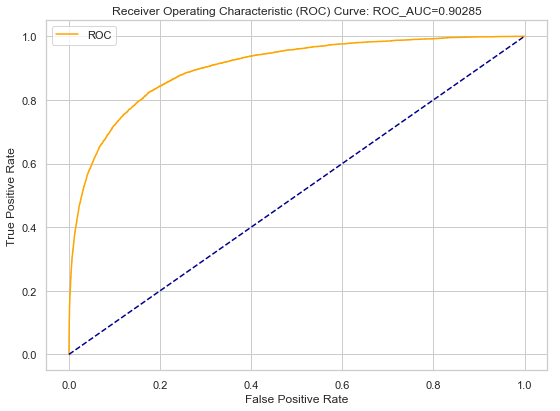

In [342]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr)

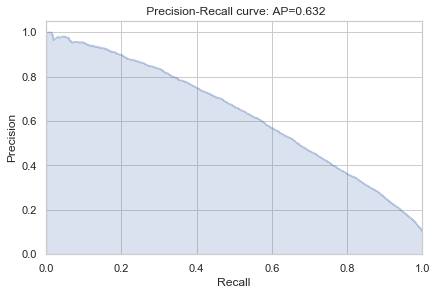

In [343]:
plot_precision_recall(y_test, y_pred)

### AutoML 

In [22]:
import h2o
print(h2o.__version__)
from h2o.automl import H2OAutoML

3.24.0.3


In [23]:
#connect to a pre-existing cluster
h2o.init(max_mem_size='5G')
df=h2o.import_file(path="C:/Users/kiran/Desktop/python practice/Santander/train.csv")

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.211-b12, mixed mode)
  Starting server from C:\Users\kiran\Anaconda3\lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\kiran\AppData\Local\Temp\tmpjtx7edmd
  JVM stdout: C:\Users\kiran\AppData\Local\Temp\tmpjtx7edmd\h2o_kiran_started_from_python.out
  JVM stderr: C:\Users\kiran\AppData\Local\Temp\tmpjtx7edmd\h2o_kiran_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,04 secs
H2O cluster timezone:,Asia/Kolkata
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.3
H2O cluster version age:,1 month and 10 days
H2O cluster name:,H2O_from_python_kiran_dhbvxc
H2O cluster total nodes:,1
H2O cluster free memory:,4.445 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [24]:
df.head(3)

ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197
train_0,0,8.9255,-6.7863,11.9081,5.093,11.4607,-9.2834,5.1187,18.6266,-4.92,5.747,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.284,30.7133,10.535,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.192,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.017,5.9226,-14.2136,16.0283,5.3253,12.9194,29.046,-0.694,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.959,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.701,21.6374,0.5663,5.1999,8.86,43.1127,18.3816,-2.344,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.71,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.524,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.78,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.676,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.691,18.5227,-2.3978,7.8784,8.5635
train_1,0,11.5006,-4.1473,13.8588,5.389,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.891,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.371,11.3702,0.7399,2.7995,5.8434,10.816,3.6783,-11.1147,1.873,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.921,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.022,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.821,-5.485,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.695,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.955,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.51,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697,2.4354,0.8194,16.5346,12.4205,-0.178,5.7582,7.0513,1.9568,-8.9921,9.7797,1

In [25]:
x = df.columns
y = 'target'

dropFeatures = ['ID_code','target']
for a in dropFeatures:
    x.remove(a)

In [26]:
# For binary classification, response should be a factor
df[y] = df[y].asfactor()

In [27]:
train,valid = df.split_frame(ratios = [.70], seed = 1234)

In [28]:
aml = H2OAutoML(max_models=25, seed=47, max_runtime_secs=7200,max_runtime_secs_per_model=400)
aml.train(x=x, y=y, training_frame=train, validation_frame = valid)

AutoML progress: |████████████████████████████████████████████████████████| 100%


In [29]:
aml.leaderboard

model_id,auc,logloss,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_AutoML_20190618_021830,0.87854,0.221585,0.261779,0.250623,0.0628121
StackedEnsemble_BestOfFamily_AutoML_20190618_021830,0.87453,0.225526,0.260969,0.252763,0.0638889
GLM_grid_1_AutoML_20190618_021830_model_1,0.858369,0.233758,0.273706,0.259035,0.0670989
DeepLearning_1_AutoML_20190618_021830,0.840454,0.248296,0.281292,0.267536,0.0715755
DeepLearning_grid_1_AutoML_20190618_021830_model_4,0.832999,0.252354,0.289446,0.269466,0.0726118
GBM_1_AutoML_20190618_021830,0.821794,0.269202,0.290638,0.27681,0.0766236
DeepLearning_grid_1_AutoML_20190618_021830_model_6,0.819091,0.261337,0.302364,0.272073,0.0740237
GBM_2_AutoML_20190618_021830,0.815858,0.271346,0.308967,0.277784,0.0771641
DeepLearning_grid_1_AutoML_20190618_021830_model_5,0.814654,0.274051,0.296077,0.270966,0.0734225
DeepLearning_grid_1_AutoML_20190618_021830_model_2,0.814591,0.271778,0.300134,0.276522,0.0764647


In [30]:
aml.leader 

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_AutoML_20190618_021830
No model summary for this model


ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.025095040114770824
RMSE: 0.15841414114519833
LogLoss: 0.10193309420723536
Null degrees of freedom: 140002
Residual degrees of freedom: 139985
Null deviance: 91146.84842995692
Residual deviance: 28541.877976591142
AIC: 28577.877976591142
AUC: 0.986780448402093
pr_auc: 0.900523051273505
Gini: 0.973560896804186
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27450578594948516: 


,0,1,Error,Rate
0,124189.0,1786.0,0.0142,(1786.0/125975.0)
1,2283.0,11745.0,0.1627,(2283.0/14028.0)
Total,126472.0,13531.0,0.0291,(4069.0/140003.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2745058,0.8523531,214.0
max f2,0.1524499,0.8724732,262.0
max f0point5,0.4538406,0.8900314,163.0
max accuracy,0.3132379,0.9713006,202.0
max precision,0.9993371,1.0,0.0
max recall,0.0184897,1.0,391.0
max specificity,0.9993371,1.0,0.0
max absolute_mcc,0.2811604,0.8364687,212.0
max min_per_class_accuracy,0.1139016,0.9435999,282.0
max mean_per_class_accuracy,0.1122138,0.9439062,283.0


Gains/Lift Table: Avg response rate: 10.02 %, avg score: 10.77 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100069,0.9935055,9.9802538,9.9802538,1.0,0.9973276,1.0,0.9973276,0.0998717,0.0998717,898.0253778,898.0253778
,2,0.0200067,0.9774397,9.9802538,9.9802538,1.0,0.9866342,1.0,0.9919828,0.0998004,0.1996721,898.0253778,898.0253778
,3,0.0300065,0.9453801,9.9659963,9.9755024,0.9985714,0.9626332,0.9995239,0.9822020,0.0996578,0.2993299,896.5996273,897.5502408
,4,0.0400063,0.8840615,9.9018375,9.9570895,0.9921429,0.9178031,0.9976790,0.9661051,0.0990163,0.3983462,890.1837498,895.7089468
,5,0.0500061,0.7950449,9.5667861,9.8790399,0.9585714,0.8421325,0.9898586,0.9413141,0.0956658,0.4940120,856.6786122,887.9039949
,6,0.1000050,0.2507270,7.1173467,8.4982919,0.7131429,0.4986705,0.8515106,0.7200081,0.3558597,0.8498717,611.7346694,749.8291947
,7,0.1500039,0.1069583,1.9604070,6.3191007,0.1964286,0.1604282,0.6331603,0.5334904,0.0980182,0.9478899,96.0406992,531.9100733
,8,0.2000029,0.0701255,0.5303792,4.8719720,0.0531429,0.0855902,0.4881611,0.4215193,0.0265184,0.9744083,-46.9620799,387.1972033
,9,0.3000007,0.0450989,0.1532682,3.2991082,0.0153571,0.0552059,0.3305636,0.2994178,0.0153265,0.9897348,-84.6731817,229.9108199
,10,0.3999986,0.0349026,0.0548914,2.4880685,0.0055,0.0394474,0.2492991,0.2344263,0.0054890,0.9952238,-94.5108604,148.8068481




ModelMetricsBinomialGLM: stackedensemble
** Reported on validation data. **

MSE: 0.06253724982731847
RMSE: 0.25007448855754655
LogLoss: 0.2208331605697196
Null degrees of freedom: 59996
Residual degrees of freedom: 59979
Null deviance: 39316.65333126726
Residual deviance: 26498.65426940293
AIC: 26534.65426940293
AUC: 0.8808782551211994
pr_auc: 0.5672940593733948
Gini: 0.7617565102423989
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.19562102790041794: 


,0,1,Error,Rate
0,51003.0,2924.0,0.0542,(2924.0/53927.0)
1,2687.0,3383.0,0.4427,(2687.0/6070.0)
Total,53690.0,6307.0,0.0935,(5611.0/59997.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1956210,0.5466591,234.0
max f2,0.0816825,0.6172350,304.0
max f0point5,0.4493505,0.5942417,143.0
max accuracy,0.4526419,0.9204627,142.0
max precision,0.9970209,1.0,0.0
max recall,0.0145719,1.0,399.0
max specificity,0.9970209,1.0,0.0
max absolute_mcc,0.2411104,0.4961870,214.0
max min_per_class_accuracy,0.0710182,0.8008237,313.0
max mean_per_class_accuracy,0.0766984,0.8029729,308.0


Gains/Lift Table: Avg response rate: 10.12 %, avg score:  9.30 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100005,0.9144029,8.9781343,8.9781343,0.9083333,0.9608864,0.9083333,0.9608864,0.0897858,0.0897858,797.8134267,797.8134267
,2,0.0200010,0.7832556,7.9567685,8.4674514,0.805,0.8509323,0.8566667,0.9059093,0.0795717,0.1693575,695.6768534,746.7451400
,3,0.0300015,0.6469125,6.9518764,7.9622597,0.7033333,0.7132232,0.8055556,0.8416806,0.0695222,0.2388797,595.1876442,696.2259747
,4,0.0400020,0.5378113,6.1281944,7.5037434,0.62,0.5928964,0.7591667,0.7794846,0.0612850,0.3001647,512.8194399,650.3743410
,5,0.0500025,0.4427440,5.3045124,7.0638972,0.5366667,0.4872923,0.7146667,0.7210461,0.0530478,0.3532125,430.4512356,606.3897199
,6,0.1000050,0.2071408,3.7988216,5.4313594,0.3843333,0.3013700,0.5495,0.5112081,0.1899506,0.5431631,279.8821582,443.1359390
,7,0.1500075,0.1285698,2.2964255,4.3863814,0.2323333,0.1614111,0.4437778,0.3946091,0.1148270,0.6579901,129.6425535,338.6381439
,8,0.2000100,0.0923009,1.4958066,3.6637377,0.1513333,0.1084162,0.3706667,0.3230609,0.0747941,0.7327842,49.5806590,266.3737727
,9,0.2999983,0.0596444,1.0429553,2.7902407,0.1055176,0.0737631,0.2822935,0.2399708,0.1042834,0.8370675,4.2955292,179.0240653
,10,0.4000033,0.0443703,0.5485722,2.2298002,0.0555,0.0511621,0.2255927,0.1927667,0.0548600,0.8919275,-45.1427759,122.9800198




ModelMetricsBinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.06281208274687658
RMSE: 0.2506233882678881
LogLoss: 0.22158455404157598
Null degrees of freedom: 140002
Residual degrees of freedom: 139986
Null deviance: 91147.24767227613
Residual deviance: 62045.00463896552
AIC: 62079.00463896552
AUC: 0.8785395098726088
pr_auc: 0.5532203627044274
Gini: 0.7570790197452175
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24165174947912865: 


,0,1,Error,Rate
0,119514.0,6461.0,0.0513,(6461.0/125975.0)
1,6625.0,7403.0,0.4723,(6625.0/14028.0)
Total,126139.0,13864.0,0.0935,(13086.0/140003.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2416517,0.5308332,215.0
max f2,0.0936398,0.6086270,296.0
max f0point5,0.4553175,0.5819429,143.0
max accuracy,0.5377870,0.9198517,121.0
max precision,0.9973110,0.9885057,0.0
max recall,0.0142773,1.0,399.0
max specificity,0.9973110,0.9999921,0.0
max absolute_mcc,0.2720906,0.4797359,203.0
max min_per_class_accuracy,0.0756660,0.7957214,313.0
max mean_per_class_accuracy,0.0799122,0.7975239,309.0


Gains/Lift Table: Avg response rate: 10.02 %, avg score: 10.02 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100069,0.9261655,9.0969194,9.0969194,0.9114918,0.9671375,0.9114918,0.9671375,0.0910322,0.0910322,809.6919397,809.6919397
,2,0.0200067,0.8168570,7.7917267,8.4445560,0.7807143,0.8737289,0.8461264,0.9204499,0.0779156,0.1689478,679.1726700,744.4556035
,3,0.0300065,0.6972117,6.7081563,7.8658939,0.6721429,0.7569619,0.7881457,0.8659669,0.0670801,0.2360279,570.8156289,686.5893897
,4,0.0400063,0.5824810,6.1521136,7.4375253,0.6164286,0.6404282,0.7452241,0.8095923,0.0615198,0.2975478,515.2113579,643.7525312
,5,0.0500061,0.4901949,5.0970582,6.9694987,0.5107143,0.5355474,0.6983288,0.7547911,0.0509695,0.3485173,409.7058180,596.9498746
,6,0.1000050,0.2374347,3.6299609,5.2998491,0.3637143,0.3411982,0.5310335,0.5480094,0.1814942,0.5300114,262.9960874,429.9849071
,7,0.1500039,0.1460331,2.2997356,4.2998589,0.2304286,0.1854206,0.4308366,0.4271522,0.1149843,0.6449957,129.9735621,329.9858873
,8,0.2000029,0.1038589,1.6025436,3.6255541,0.1605714,0.1224546,0.3632727,0.3509805,0.0801255,0.7251212,60.2543607,262.5554138
,9,0.3000007,0.0648787,1.0336691,2.7616130,0.1035714,0.0812829,0.2767077,0.2610835,0.1033647,0.8284859,3.3669141,176.1613043
,10,0.3999986,0.0471678,0.6365976,2.2303687,0.0637857,0.0551485,0.2234782,0.2096006,0.0636584,0.8921443,-36.3402384,123.0368673


In [59]:
aml.leaderboard[:5,"model_id"]

model_id
StackedEnsemble_AllModels_AutoML_20190618_021830
StackedEnsemble_BestOfFamily_AutoML_20190618_021830
GLM_grid_1_AutoML_20190618_021830_model_1
DeepLearning_1_AutoML_20190618_021830
DeepLearning_grid_1_AutoML_20190618_021830_model_4


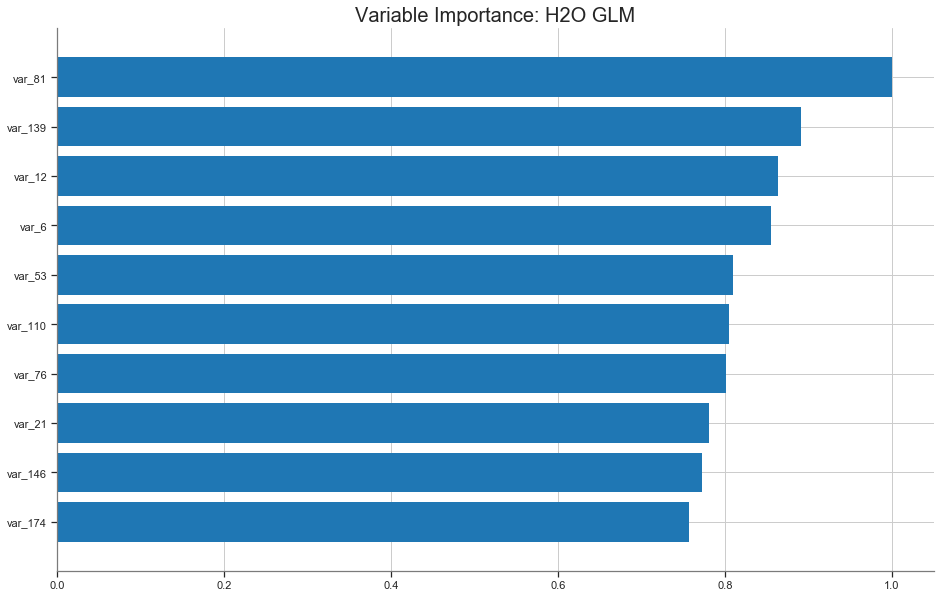

In [63]:
m = h2o.get_model(aml.leaderboard[2,"model_id"])
m.varimp_plot()